importing libraries

In [43]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns


In [44]:
import zipfile
import os

# Path to the zip file
dataset = "animal_data.zip"

# Directory to extract files to
dir = "animal_data"
os.makedirs("animal_data", exist_ok=True)

# Use 'with' statement to extract the zip file
with zipfile.ZipFile("animal_data.zip", 'r') as zip_ref:
    # Extract all files to the specified directory
    zip_ref.extractall("animal_data")

In [45]:
class_names = sorted(os.listdir("animal_data/animal_data"))
print("Class Names: \n", class_names)
num_classes = len(class_names)
print("Number of Classes: ", num_classes)

Class Names: 
 ['Bear', 'Bird', 'Cat', 'Cow', 'Deer', 'Dog', 'Dolphin', 'Elephant', 'Giraffe', 'Horse', 'Kangaroo', 'Lion', 'Panda', 'Tiger', 'Zebra']
Number of Classes:  15


In [46]:
# Get the number of samples in each class
class_sizes = []
for name in class_names:
    class_size = len(os.listdir("animal_data/animal_data" + "/" + name))
    class_sizes.append(class_size)

# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [125, 137, 123, 131, 127, 122, 129, 133, 129, 130, 126, 131, 135, 129, 137]


In [47]:
# to convert lists to dictionary **************
class_name_size = dict(zip(class_names, class_sizes))
class_name_size

{'Bear': 125,
 'Bird': 137,
 'Cat': 123,
 'Cow': 131,
 'Deer': 127,
 'Dog': 122,
 'Dolphin': 129,
 'Elephant': 133,
 'Giraffe': 129,
 'Horse': 130,
 'Kangaroo': 126,
 'Lion': 131,
 'Panda': 135,
 'Tiger': 129,
 'Zebra': 137}

In [48]:
import plotly.graph_objects as go
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

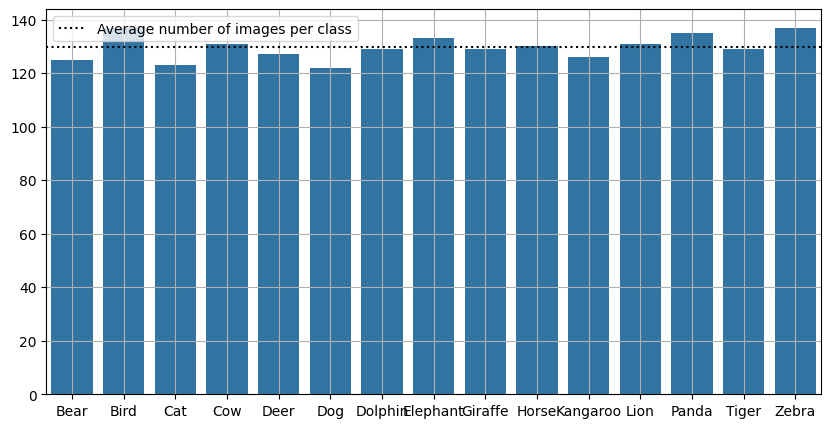

In [49]:
# Plot a bar graph of the number of images in each class

# Set the size of the figure
plt.figure(figsize=(10,5))

# Plot a bar chart using the class names as the x-axis and class sizes as the y-axis
sns.barplot(x=class_names, y=class_sizes)

# Add a grid to the plot
plt.grid()

# Add a horizontal line to show the mean number of images across all classes
plt.axhline(np.mean(class_sizes), color='black', linestyle=':', label="Average number of images per class")

# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()

In [50]:
np.min(class_sizes)

122

In [51]:
import os
# Set the path to the directory where the sampled data will be saved
sampled_data_path = './sampled-data'

# Create the sampled data directory if it doesn't exist
if not os.path.exists(sampled_data_path):
    os.mkdir(sampled_data_path)

# Set the percentage of each class to sample
# since dataset has classes with unequal frequencies
sample_percent = 0.067 #100/15%
class_names_dict = {
    'Bear':'Bear', 'Bird':'Bird', 'Cat':'Cat', 'Cow':'Cow', 'Deer':'Deer', 'Dog':'Dog', 'Dolphin':'Dolphin', 'Elephant':'Elephant', 'Giraffe':'Giraffe', 'Horse':'Horse', 'Kangaroo':'Kangaroo', 'Lion':'Lion', 'Panda':'Panda', 'Tiger':'Tiger', 'Zebra':'Zebra'}


In [52]:
import shutil
# Get the number of samples in each class  # This was moved from a previous cell
class_sizes = []
for name in os.listdir("animal_data/animal_data"): # Adjusted to match loop below
    class_size = len(os.listdir("animal_data/animal_data" + "/" + name))
    class_sizes.append(class_size)
class_name_size = dict(zip(os.listdir("animal_data/animal_data"), class_sizes)) # Adjusted to match loop below
# Loop through each class directory and copy 2000 images or less to the sampled data directory
for class_name in os.listdir("animal_data/animal_data"):
    # Get the path to the original class directory
    class_path = os.path.join("animal_data/animal_data", class_name)
    # Get the English name of the class
    class_name_en = class_names_dict[class_name]
    # Get the path to the sampled class directory
    sampled_class_path = os.path.join(sampled_data_path, class_name_en)
    # Create the sampled class directory and fill it up only if it doesn't exist ********
    if not os.path.exists(sampled_class_path):
        os.mkdir(sampled_class_path)
        # Get a list of all the image files in the class directory
        image_files = os.listdir(class_path)
        # Calculate the number of images to sample **************
        image_class_size = class_name_size[class_name]
        if image_class_size > 2000:
            num_images = 2000
        else:
            num_images = int(image_class_size)
        # Sample the images
        sampled_images = np.random.choice(image_files, size=num_images, replace=False)
        # Copy the sampled images to the sampled class directory
        for image_name in sampled_images:
            src_path = os.path.join(class_path, image_name)
            dst_path = os.path.join(sampled_class_path, image_name)
            shutil.copyfile(src_path, dst_path)

In [53]:
# Get a list of class names from the sampled data directory
class_names = sorted(os.listdir(sampled_data_path))

# Get the number of samples in each class
class_sizes = []
for name in class_names:
    # Get the number of samples in the class directory
    class_size = len(os.listdir(os.path.join(sampled_data_path, name)))
    class_sizes.append(class_size)

# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [125, 137, 123, 131, 127, 122, 129, 133, 129, 130, 126, 131, 135, 129, 137]


In [54]:
import plotly.graph_objects as go
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

In [55]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Initialize Generator with the specified image transformations and preprocessing
# rescale: normalizes pixel values from 0-255 to 0-1
# horizontal_flip: randomly flips images horizontally
# vertical_flip: randomly flips images vertically
# rotation_range: randomly rotates images by a given range in degrees
# validation_split: splits the data into training and validation sets, with 20% of the data used for validation
data_generator = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    validation_split=0.2)

# Load training data from the specified directory and apply the generator
# target_size: resizes the images to a specified size
# class_mode: specifies the type of label encoding, binary for 2 classes
# batch_size: specifies the number of samples per batch
# shuffle: shuffles the data after each epoch
# subset: specifies the subset of data to load, in this case, the training set
train_data = data_generator.flow_from_directory(
    sampled_data_path,
    target_size=(256,256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='training')

# Load validation data from the specified directory and apply the generator
# subset: specifies the subset of data to load, in this case, the validation set
valid_data = data_generator.flow_from_directory(
    sampled_data_path,
    target_size=(256,256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='validation')

Found 1561 images belonging to 15 classes.
Found 383 images belonging to 15 classes.


**DATA** **VISUALIZATION**

In [56]:
def show_image(image, image_title=None):
    '''
    This function takes in an image and an optional title and plots the image.
    '''
    # Display the image
    plt.imshow(image)

    # Set the title of the plot if provided
    plt.title(image_title)

    # Turn off the axes in the plot
    plt.axis('off')

In [57]:
def get_random_data(data_tuple):
    """
    Function to get a random data point from a given dataset.

    Args:
    data_tuple (tuple): A tuple containing the dataset images and labels as numpy arrays.

    Returns:
    A random image and its corresponding label as numpy arrays.
    """
    images, labels = data_tuple
    # get a random index for an image in the dataset
    idx = np.random.randint(len(images))

    # select the image and its corresponding label using the random index
    image, label = images[idx], labels[idx]

    # return the selected image and label
    return image, label

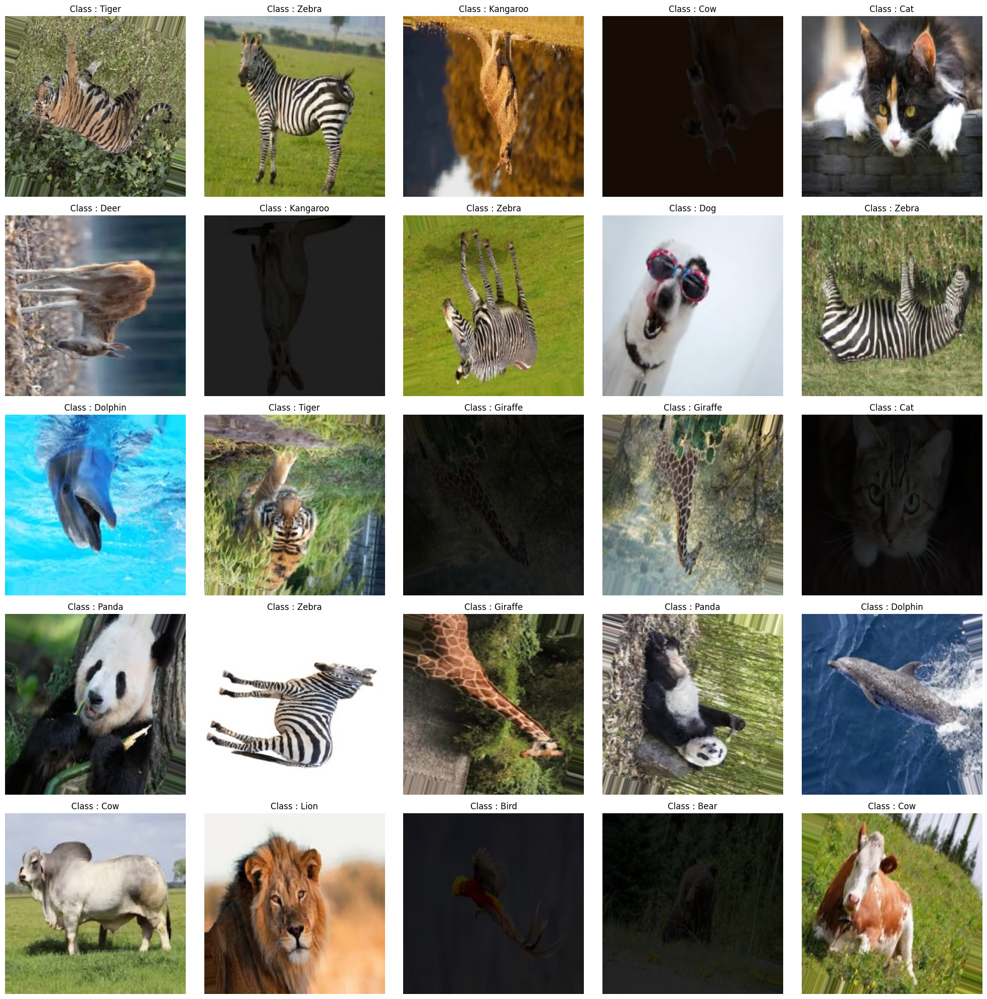

In [58]:
# Set the figure size for the plot
plt.figure(figsize=(20,20))

# Initialize a counter for the subplots
counter=1

# Loop over the train dataset
for images, labels in iter(train_data):

    # Get a random image and label
    image, label = get_random_data([images, labels])

    # Plot the image with its class name as the title
    plt.subplot(5,5,counter)
    show_image(image, image_title=f"Class : {class_names[int(label)]}")

    # Increment the counter
    counter+=1

    # End the loop when 25 images have been plotted
    if counter>=26: break

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

**Model** **Training**

In [70]:
from tensorflow.keras.applications import InceptionV3

# Specify the name of the model as "Inception".
name = "Inception"

# Load the pre-trained InceptionV3 model, freeze its weights and exclude its final classification layer.
base_model = InceptionV3(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the InceptionV3 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
inception = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
inception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".keras", save_best_only=True)
]

# Train the model using the training and validation datasets, using 10 epochs and the previously defined callbacks.
inception.fit(
    train_data, validation_data=valid_data,
    epochs=10, callbacks=cbs
)

# achieved 90 % accuracy in 4 epochs

Epoch 1/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.4327 - loss: 1.8974

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



49/49 ━━━━━━━━━━━━━━━━━━━━ 376s 7s/step - accuracy: 0.4363 - loss: 1.8852 - val_accuracy: 0.7781 - val_loss: 0.7259
Epoch 2/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 371s 7s/step - accuracy: 0.8454 - loss: 0.5187 - val_accuracy: 0.7833 - val_loss: 0.7365
Epoch 3/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 358s 7s/step - accuracy: 0.8815 - loss: 0.3914 - val_accuracy: 0.8094 - val_loss: 0.5770
Epoch 4/10
49/49 ━━━━━━━━━━━━━━━━━━━━ 381s 7s/step - accuracy: 0.9034 - loss: 0.3184 - val_accuracy: 0.8277 - val_loss: 0.5839
Epoch 5/10
12/49 ━━━━━━━━━━━━━━━━━━━━ 3:59 6s/step - accuracy: 0.8718 - loss: 0.3124

KeyboardInterrupt: 

In [74]:
from tensorflow import keras
loaded_model = keras.models.load_model("Inception.keras")
loaded_model.evaluate(valid_data)

12/12 ━━━━━━━━━━━━━━━━━━━━ 78s 6s/step - accuracy: 0.8035 - loss: 0.5850


[0.6020166873931885, 0.8015666007995605]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step


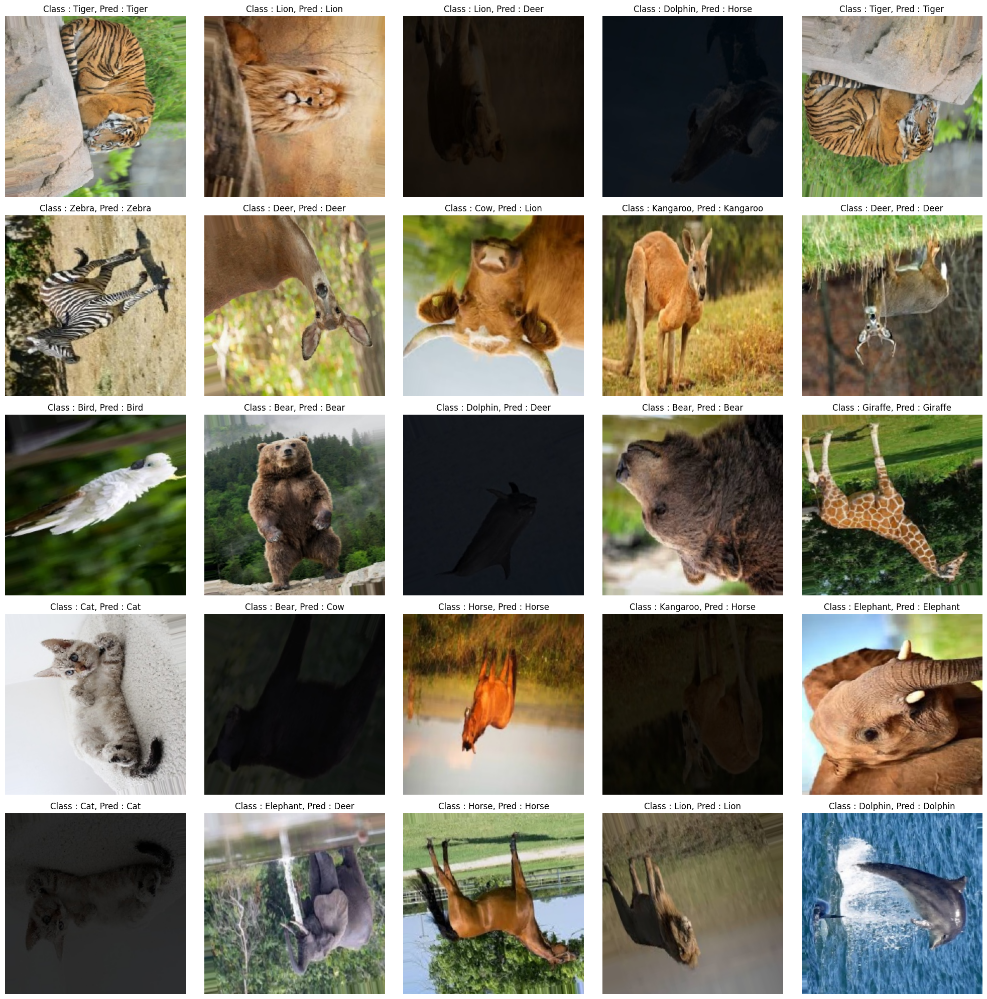

In [75]:
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(valid_data):

    # Get Random Image and label
    image, label = get_random_data([images, labels])
    pred_label = class_names[np.argmax(loaded_model.predict(image[np.newaxis,...]))]

    # Plot it
    plt.subplot(5,5,i)
    show_image(image, image_title=f"Class : {class_names[int(label)]}, Pred : {pred_label}")

    # Make sure to end the Loop
    i+=1
    if i>=26: break


plt.tight_layout()
plt.show()